# Replication 1: Julia
Group  : 1

Members:
- Juan José Tang
- Ursula Cotrina 
- Victoria Olivera

## Item 2: Descriptive Statistics

In [1]:
using Pkg


Pkg.add("DataFrames")
Pkg.add("Dates")
Pkg.add("CategoricalArrays")
Pkg.add("RData")
Pkg.add("Distributions")
Pkg.add("Gadfly")
Pkg.add("Plots")
Pkg.add("RDatasets")
Pkg.add("Compose")

using DataFrames
using Dates
using Statistics,RData  #upload data of R format 
using CategoricalArrays # categorical data
using Gadfly
using Plots

    Updating registry at `C:\Users\Victoria\.julia\registries\General`
    Updating git-repo `https://github.com/JuliaRegistries/General.git`
   Resolving package versions...
  No Changes to `C:\Users\Victoria\.julia\environments\v1.6\Project.toml`
  No Changes to `C:\Users\Victoria\.julia\environments\v1.6\Manifest.toml`
   Resolving package versions...
  No Changes to `C:\Users\Victoria\.julia\environments\v1.6\Project.toml`
  No Changes to `C:\Users\Victoria\.julia\environments\v1.6\Manifest.toml`
   Resolving package versions...
  No Changes to `C:\Users\Victoria\.julia\environments\v1.6\Project.toml`
  No Changes to `C:\Users\Victoria\.julia\environments\v1.6\Manifest.toml`
   Resolving package versions...
  No Changes to `C:\Users\Victoria\.julia\environments\v1.6\Project.toml`
  No Changes to `C:\Users\Victoria\.julia\environments\v1.6\Manifest.toml`
   Resolving package versions...
  No Changes to `C:\Users\Victoria\.julia\environments\v1.6\Project.toml`
  No Changes to `C:\Use

In [2]:
rdata_read = load("../../data/wage2015_subsample_inference.RData")
data = rdata_read["data"]
names(data)
println("Number of Rows : ", size(data)[1],"\n","Number of Columns : ", size(data)[2],) #rows and columns

Number of Rows : 5150
Number of Columns : 20


***Variable description***

- occ : occupational classification
- ind : industry classification
- lwage : log hourly wage
- sex : gender (1 female) (0 male)
- shs : some high school
- hsg : High school graduated
- scl : Some College
- clg: College Graduate
- ad: Advanced Degree
- ne: Northeast
- mw: Midwest
- so: South
- we: West
- exp1: experience

In [3]:
Z = select(data, ["wage","lwage","sex","shs","hsg","scl","clg","ad","ne","mw","so","we","exp1"])
#wage lwage sex shs hsg scl clg ad exp1
data_female = filter(row -> row.sex == 1, data)
Z_female = select(data_female,["wage","lwage","sex","shs","hsg","scl","clg","ad","ne","mw","so","we","exp1"] )

data_male = filter(row -> row.sex == 0, data)
Z_male = select(data_male,["wage","lwage","sex","shs","hsg","scl","clg","ad","ne","mw","so","we","exp1"] )

means = DataFrame( variables = names(Z), All = describe(Z, :mean)[!,2], Men = describe(Z_male,:mean)[!,2], Female = describe(Z_female,:mean)[!,2])


,variables,All,Men,Female
,String,Float64,Float64,Float64
1,wage,23.4104,24.0193,22.6494
2,lwage,2.97079,2.98783,2.94948
3,sex,0.444466,0.0,1.0
4,shs,0.023301,0.0318071,0.0126693
5,hsg,0.243883,0.294303,0.180865
6,scl,0.278058,0.273331,0.283967
7,clg,0.31767,0.293953,0.347313
8,ad,0.137087,0.106606,0.175186
9,ne,0.227767,0.22195,0.235037


## Wage - Lwage

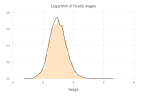

In [4]:
Gadfly.plot(Z, Coord.cartesian(xmin=0, xmax=8),
    layer(x = "lwage", Geom.density , color=[colorant"black"]),
    layer(x = "lwage", Geom.histogram(bincount=30, density=true, limits=(min=0,)),
    color=[colorant"bisque"]),
    Guide.title("Logarithm of hourly wages")
)

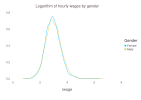

In [5]:
using Gadfly, Distributions
Z1=copy(Z)
Z1[!,:sex] = string.(Z[!,:sex]) 
replace!(Z1.sex, "1.0" => "Female")
replace!(Z1.sex, "0.0" => "Male")
rename!(Z1, "sex" => "Gender")
Gadfly.plot(Z1, x = "lwage", color="Gender", Geom.density, style(line_width=3mm), 
    Guide.title("Logarithm of hourly wages by gender"),
    Theme(grid_color = colorant"white", grid_color_focused = colorant"white")
)


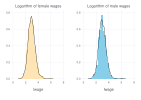

In [6]:
p1=Gadfly.plot(Z_female, Coord.cartesian(xmin=0, xmax=8),
    layer(x = "lwage", Geom.density , color=[colorant"black"]),
    layer(x = "lwage", Geom.histogram(bincount=25, density=true, limits=(min=0,)),
    color=[colorant"moccasin"]),
    Guide.title("Logarithm of female wages"))
p2=Gadfly.plot(Z_male, Coord.cartesian(xmin=0, xmax=8),
    layer(x = "lwage", Geom.density , color=[colorant"black"]),
    layer(x = "lwage", Geom.histogram(bincount=25, density=true, limits=(min=0,)),
    color=[colorant"skyblue"]),
    Guide.title("Logarithm of male wages"))
gridstack([p1 p2])

## Gender

In [7]:
using Compose
ZX=copy(Z1)
insertcols!(ZX,3
    ,:Freq => 1)  
ZX=combine(groupby(ZX, [:Gender]),:Freq=>sum=>:Frequency)

,Gender,Frequency
,String,Int64
1,Female,2289
2,Male,2861


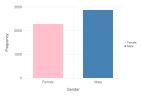

In [8]:
Gadfly.plot(ZX, x=:Gender,y=:Frequency,color=:Gender, Geom.bar(position=:dodge),
    Theme(bar_spacing=2cm, minor_label_font_size = 3.5mm),
    Scale.color_discrete_manual("pink","steelblue"),
    Guide.xticks(orientation=:horizontal),
    Guide.colorkey(""),
    Guide.yticks(ticks=[0,1000,2000,3000])
)

## Schooling

In [9]:
Z2 = copy(Z1)
replace!(Z2.hsg, 1 => 2)
replace!(Z2.scl, 1 => 3)
replace!(Z2.clg, 1 => 4)
replace!(Z2.ad,  1 => 5)
Z2=select(Z2,:wage,:lwage,:Gender,:shs,:hsg,:scl,:clg,:ad,:ne,:mw,:so,:we,:exp1,[:shs, :hsg, :scl, :clg, :ad] => (+) => :EducationLevel)

Z2[!,:EducationLevel] = string.(Z2[!,:EducationLevel]) 
replace!(Z2.EducationLevel, "1.0" => "A_SomeHighschool")
replace!(Z2.EducationLevel, "2.0" => "B_HighschoolGraduate")
replace!(Z2.EducationLevel, "3.0" => "C_SomeCollege")
replace!(Z2.EducationLevel, "4.0" => "D_CollegeGraduate")
replace!(Z2.EducationLevel, "5.0" => "E_AdvancedDegree")
select(Z2,:lwage,:shs,:scl,:hsg,:clg,:ad,:EducationLevel)

,lwage,shs,scl,hsg,clg,ad,EducationLevel
,Float64,Float64,Float64,Float64,Float64,Float64,String
1,2.26336,0.0,0.0,0.0,4.0,0.0,D_CollegeGraduate
2,3.8728,0.0,0.0,0.0,4.0,0.0,D_CollegeGraduate
3,2.40313,0.0,0.0,2.0,0.0,0.0,B_HighschoolGraduate
4,2.63493,0.0,0.0,0.0,0.0,5.0,E_AdvancedDegree
5,3.36198,0.0,0.0,0.0,4.0,0.0,D_CollegeGraduate
6,2.46222,0.0,0.0,0.0,4.0,0.0,D_CollegeGraduate
7,2.95651,0.0,0.0,2.0,0.0,0.0,B_HighschoolGraduate
8,2.95651,0.0,0.0,2.0,0.0,0.0,B_HighschoolGraduate
9,2.48491,0.0,0.0,2.0,0.0,0.0,B_HighschoolGraduate


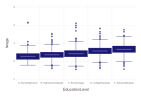

In [10]:
p3=Gadfly.plot(Z2, x=:EducationLevel, y=:lwage, Geom.boxplot,
    Theme(default_color="MidnightBlue", minor_label_font_size = 2.2mm),
    Scale.x_discrete(levels=levels(Z2.EducationLevel)),
    Guide.xticks(orientation=:horizontal)
)
p3

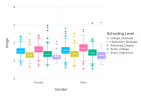

In [11]:
Gadfly.plot(Z2, x=:Gender, y=:lwage, color=:EducationLevel,
    Scale.x_discrete(levels=["Female", "Male"]),
    Geom.boxplot,
    Guide.manual_color_key("Schooling Level", ["College_Graduate", "Highschool_Graduate","Advanced_Degree","Some_College","Some_Highschool"]),
    Theme(key_position=:none),
)

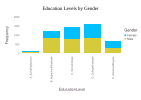

In [12]:
using Compose
Z3=copy(Z2)
insertcols!(Z3,4
    ,:Freq => 1)  
Z3=combine(groupby(Z3, [:Gender,:EducationLevel]),:Freq=>sum=>:Frequency)

p5 =Gadfly.plot(Z3, x=:EducationLevel,y=:Frequency, color=:Gender, Geom.bar(position=:stack),
    Scale.x_discrete(levels=levels(Z2.EducationLevel)),
    Theme(bar_spacing=4mm,grid_color = colorant"white", grid_color_focused = colorant"white", minor_label_font_size = 2.5mm),
    Guide.xticks(orientation=:vertical),
    )
p6 = title(render(p5), "Education Levels by Gender", Compose.fontsize(14pt))


## Experience

In [13]:
Z2=rename!(Z2, "exp1" => "Experience")

,wage,lwage,Gender,shs,hsg,scl,clg,ad,ne
,Float64,Float64,String,Float64,Float64,Float64,Float64,Float64,Float64
1,9.61538,2.26336,Female,0.0,0.0,0.0,4.0,0.0,1.0
2,48.0769,3.8728,Male,0.0,0.0,0.0,4.0,0.0,1.0
3,11.0577,2.40313,Male,0.0,2.0,0.0,0.0,0.0,1.0
4,13.9423,2.63493,Female,0.0,0.0,0.0,0.0,5.0,1.0
5,28.8462,3.36198,Female,0.0,0.0,0.0,4.0,0.0,1.0
6,11.7308,2.46222,Female,0.0,0.0,0.0,4.0,0.0,1.0
7,19.2308,2.95651,Female,0.0,2.0,0.0,0.0,0.0,1.0
8,19.2308,2.95651,Male,0.0,2.0,0.0,0.0,0.0,1.0
9,12.0,2.48491,Female,0.0,2.0,0.0,0.0,0.0,1.0


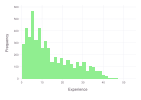

In [14]:
Gadfly.plot(Z2, x=:"Experience", Coord.cartesian(xmin=0, xmax=55),
    Geom.histogram(bincount=30, density=false, limits=(min=0,)),
    color=[colorant"lightgreen"],
    Guide.ylabel("Frequency"),
)

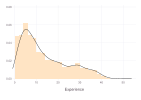

In [15]:
p8= Gadfly.plot(Z2, Coord.cartesian(xmin=0, xmax=55),
    layer(x = "Experience", Geom.density , color=[colorant"black"]),
    layer(x = "Experience", Geom.histogram(bincount=30, density=true, limits=(min=0,)),
    color=[colorant"bisque"]),
)

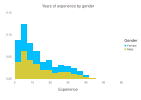

In [16]:
Gadfly.plot(Z2, x = "Experience", color="Gender", Geom.histogram(bincount=15, density=true), style(line_width=3mm),
    Theme(grid_color = colorant"white", grid_color_focused = colorant"white"),
    Guide.title("Years of experience by gender")
)

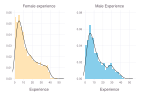

In [17]:
p1=Gadfly.plot(Z_female, Coord.cartesian(xmin=0, xmax=55),
    layer(x = "exp1", Geom.density , color=[colorant"black"]),
    layer(x = "exp1", Geom.histogram(bincount=25, density=true, limits=(min=0,)),
    color=[colorant"moccasin"]),
    Guide.title("Female experience"),
    Guide.xlabel("Experience")
)
p2=Gadfly.plot(Z_male, Coord.cartesian(xmin=0, xmax=55),
    layer(x = "exp1", Geom.density , color=[colorant"black"]),
    layer(x = "exp1", Geom.histogram(bincount=25, density=true, limits=(min=0,)),
    color=[colorant"skyblue"]),
    Guide.title("Male Experience"),
    Guide.xlabel("Experience")
)
gridstack([p1 p2])

## Scatter Plots

In [18]:
Gadfly.plot(Z2, x="Experience",y="lwage"
)
    

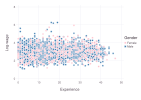

In [19]:
Gadfly.plot(Z2, x="Experience",y="lwage",color="Gender",
    Scale.color_discrete_manual("pink","steelblue"),
    Guide.ylabel("Log-wage")
)

## Item 4: Paper Replication

In [22]:
#install all the package that we can need
Pkg.add("Lathe")
Pkg.add("GLM") # package to run models 
Pkg.add("StatsPlots")
Pkg.add("MLBase")
Pkg.add("Tables")
Pkg.add("CovarianceMatrices") # robust standar error 
# Load the installed packages
using DataFrames
using CSV
using Tables
using Lathe
using GLM
using CovarianceMatrices


   Resolving package versions...
  No Changes to `C:\Users\Victoria\.julia\environments\v1.6\Project.toml`
  No Changes to `C:\Users\Victoria\.julia\environments\v1.6\Manifest.toml`
   Resolving package versions...
  No Changes to `C:\Users\Victoria\.julia\environments\v1.6\Project.toml`
  No Changes to `C:\Users\Victoria\.julia\environments\v1.6\Manifest.toml`
   Resolving package versions...
  No Changes to `C:\Users\Victoria\.julia\environments\v1.6\Project.toml`
  No Changes to `C:\Users\Victoria\.julia\environments\v1.6\Manifest.toml`
   Resolving package versions...
  No Changes to `C:\Users\Victoria\.julia\environments\v1.6\Project.toml`
  No Changes to `C:\Users\Victoria\.julia\environments\v1.6\Manifest.toml`
   Resolving package versions...
  No Changes to `C:\Users\Victoria\.julia\environments\v1.6\Project.toml`
  No Changes to `C:\Users\Victoria\.julia\environments\v1.6\Manifest.toml`
   Resolving package versions...
  No Changes to `C:\Users\Victoria\.julia\environments\v1

In [29]:
Z4=copy(data)
Z4=filter(row->row.sex in [0], Z4)
Z4=filter(row->row.hsg in [1] || row.clg in [1], Z4)

#Z4=hcat(data, data.lwage, makeunique=true)
#A=filter(row->row.hsg in [1], Z4)
#B=filter(row->row.clg in [1], Z4 )

#A=combine(groupby(A, [:exp1]),:x1=>mean=>:mean_lwage)
#A=insertcols!(A,3
#    ,:hsg => 1) 
#A=insertcols!(A,4
#    ,:clg => 0)

#B=combine(groupby(B, [:exp1]),:x1=>mean=>:mean_lwage)
#B=insertcols!(B,3
#   ,:hsg => 0)
#B=insertcols!(B,4
#    ,:clg => 1)

,wage,lwage,sex,shs,hsg,scl,clg,ad,mw
,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,48.0769,3.8728,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,11.0577,2.40313,0.0,0.0,1.0,0.0,0.0,0.0,0.0
3,19.2308,2.95651,0.0,0.0,1.0,0.0,0.0,0.0,0.0
4,12.0192,2.48651,0.0,0.0,1.0,0.0,0.0,0.0,0.0
5,27.8846,3.32808,0.0,0.0,1.0,0.0,0.0,0.0,0.0
6,21.6,3.07269,0.0,0.0,1.0,0.0,0.0,0.0,0.0
7,19.2308,2.95651,0.0,0.0,1.0,0.0,0.0,0.0,0.0
8,13.1868,2.57922,0.0,0.0,1.0,0.0,0.0,0.0,0.0
9,19.2308,2.95651,0.0,0.0,0.0,0.0,1.0,0.0,0.0


In [30]:
RM_model = lm(@formula(lwage ~ clg + (exp1+exp2)^2),Z4)
RM_est = GLM.coef(RM_model)
RM_predict = predict(RM_model)
Z4 = hcat(Z4,RM_predict)
describe(Z4)

,variable,mean,min,median,max,nmissing,eltype
,Symbol,Union…,Any,Union…,Any,Int64,DataType
1,wage,22.8229,3.36538,19.2308,276.923,0,Float64
2,lwage,2.96495,1.21354,2.95651,5.62374,0,Float64
3,sex,0.0,0.0,0.0,0.0,0,Float64
4,shs,0.0,0.0,0.0,0.0,0,Float64
5,hsg,0.500297,0.0,1.0,1.0,0,Float64
6,scl,0.0,0.0,0.0,0.0,0,Float64
7,clg,0.499703,0.0,0.0,1.0,0,Float64
8,ad,0.0,0.0,0.0,0.0,0,Float64
9,mw,0.25609,0.0,0.0,1.0,0,Float64


In [31]:
Z4_hsg=filter(row->row.hsg in [1], Z4)
Z4_clg=filter(row->row.clg in [1], Z4)

,wage,lwage,sex,shs,hsg,scl,clg,ad,mw
,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,48.0769,3.8728,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,19.2308,2.95651,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,16.8269,2.82298,0.0,0.0,0.0,0.0,1.0,0.0,0.0
4,19.6703,2.97911,0.0,0.0,0.0,0.0,1.0,0.0,0.0
5,33.9893,3.52604,0.0,0.0,0.0,0.0,1.0,0.0,0.0
6,23.0769,3.13883,0.0,0.0,0.0,0.0,1.0,0.0,0.0
7,23.3339,3.14991,0.0,0.0,0.0,0.0,1.0,0.0,0.0
8,6.04396,1.79906,0.0,0.0,0.0,0.0,1.0,0.0,0.0
9,51.9231,3.94976,0.0,0.0,0.0,0.0,1.0,0.0,0.0


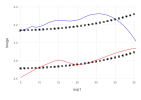

In [32]:
p8= Gadfly.plot(Coord.cartesian(xmin=5, xmax=35),
    layer(Z4_clg, x = "exp1", y = "lwage", Geom.smooth(method=:loess), color=[colorant"blue"]),
    layer(Z4_clg, x = "exp1", y = "x1", color=[colorant"black"]),
    layer(Z4_hsg, x = "exp1", y = "lwage", Geom.smooth(method=:loess), color=[colorant"red"]),
    layer(Z4_hsg, x = "exp1", y = "x1", color=[colorant"black"])
    
)

## Item 5: Interval Confidence of sex's coefficient

In [33]:
#install all the package that we can need
Pkg.add("Lathe")
Pkg.add("GLM") # package to run models 
Pkg.add("StatsPlots")
Pkg.add("MLBase")
Pkg.add("Tables")
Pkg.add("CovarianceMatrices") # robust standar error 
# Load the installed packages
using DataFrames
using CSV
using Tables
using Lathe
using GLM
using CovarianceMatrices

   Resolving package versions...
  No Changes to `C:\Users\Victoria\.julia\environments\v1.6\Project.toml`
  No Changes to `C:\Users\Victoria\.julia\environments\v1.6\Manifest.toml`
   Resolving package versions...
  No Changes to `C:\Users\Victoria\.julia\environments\v1.6\Project.toml`
  No Changes to `C:\Users\Victoria\.julia\environments\v1.6\Manifest.toml`
   Resolving package versions...
  No Changes to `C:\Users\Victoria\.julia\environments\v1.6\Project.toml`
  No Changes to `C:\Users\Victoria\.julia\environments\v1.6\Manifest.toml`
   Resolving package versions...
  No Changes to `C:\Users\Victoria\.julia\environments\v1.6\Project.toml`
  No Changes to `C:\Users\Victoria\.julia\environments\v1.6\Manifest.toml`
   Resolving package versions...
  No Changes to `C:\Users\Victoria\.julia\environments\v1.6\Project.toml`
  No Changes to `C:\Users\Victoria\.julia\environments\v1.6\Manifest.toml`
   Resolving package versions...
  No Changes to `C:\Users\Victoria\.julia\environments\v1

In [34]:
function coefplot(m)
        DF  = DataFrame(x=coefnames(m),y=coef(m), mins=confint(m)[:,1], maxs=confint(m)[:,2])[2:end,:] #no intercept
        Gadfly.plot(DF, x=:x, y=:y, ymin=:mins, ymax=:maxs,
        Geom.point, Geom.errorbar,
        Guide.xlabel(""),
        Guide.ylabel("")
        )
end

coefplot (generic function with 1 method)

### Basic Model

In [35]:
nocontrol_model = lm(@formula(lwage ~ sex), data)
nocontrol_est = GLM.coef(nocontrol_model)[2]
nocontrol_se = GLM.coeftable(nocontrol_model).cols[2][2]
nocontrol_se1 = stderror(HC1(), nocontrol_model)[2]
println("The estimated gender coefficient is ", nocontrol_est ," and the corresponding robust standard error is " ,nocontrol_se1)

The estimated gender coefficient is -0.03834473367441389 and the corresponding robust standard error is 0.015905023733117172


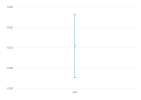

In [36]:
coefplot(nocontrol_model)

### OLS regression with controls

In [37]:
flex = @formula(lwage ~ sex + (exp1+exp2) * (clg))
control_model = lm(flex , data)
control_est = GLM.coef(control_model)[2]
control_se = GLM.coeftable(control_model).cols[2][2]
control_se1 = stderror( HC0(), control_model)[2]


0.015553650999633486

In [38]:
println("Coefficient for OLS with controls " , control_est, "robust standard error:", control_se1)

Coefficient for OLS with controls -0.05237221105227891robust standard error:0.015553650999633486


In [39]:
coefplot(control_model)

### Partialling-out using ols

In [40]:
# models
# model for Y
flex_y = @formula(lwage ~ (exp1+exp2+exp3+exp4) * (shs+hsg+scl+clg+occ2+ind2+mw+so+we))
flex_d = @formula(sex ~ (exp1+exp2+exp3+exp4) * (shs+hsg+scl+clg+occ2+ind2+mw+so+we))

# partialling-out the linear effect of W from Y
t_Y = residuals(lm(flex_y, data))

# partialling-out the linear effect of W from D
t_D = residuals(lm(flex_d, data))

data_res = DataFrame(t_Y = t_Y, t_D = t_D )
# regression of Y on D after partialling-out the effect of W

partial_fit = lm(@formula(t_Y ~ t_D), data_res)

partial_est = GLM.coef(partial_fit)[2]

# standard error
partial_se = GLM.coeftable(partial_fit).cols[2][2]

partial_se1 = stderror( HC0(), partial_fit)[2]

#condifence interval
GLM.confint(partial_fit)[2,:]

2-element Vector{Float64}:
 -0.09867142357486341
 -0.04043498301882872

In [41]:
println("Coefficient for D via partiallig-out ", partial_est, " robust standard error:", control_se1 )

Coefficient for D via partiallig-out -0.06955320329684607 robust standard error:0.015553650999633486


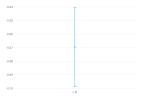

In [42]:
coefplot(partial_fit)

### Summarize the results

In [43]:
DataFrame(modelos = [ "Without controls", "full reg", "partial reg" ], 
Estimate = [nocontrol_est,control_est, partial_est], 
StdError = [nocontrol_se1,control_se1, partial_se1])

,modelos,Estimate,StdError
,String,Float64,Float64
1,Without controls,-0.0383447,0.015905
2,full reg,-0.0523722,0.0155537
3,partial reg,-0.0695532,0.0150005


## Item 6: Proof of the Frisch-Waugh-Lovell Theorem

Let the following equation

$$\overset{nx1}y=\overset{nxk_1}D \overset{k_1x1}\beta_1 + \overset{nxk_2}W \overset{k_2x1}\beta_2+\overset{nx1}\mu$$

Where $y$ is the vector of dependent variables, $D$ is a matrix of regresors (in this particular case, it will represent the variable "sex") , $\beta_1$ is the coefficient vector asocciated to D, W is the matrix of all other dependent variables, $\beta_2$ the coefficient vector asocciated to W, and $\mu$ the vector of innovations.

The Frisch-Waugh-Lovell Theorem states that we can obtain $\beta_1$ through the alternative regression:

$$\epsilon^y = \epsilon^D \psi+\xi $$




### 1. First Step

First, we need to regress

$$y=W \alpha_1 +\epsilon^y  $$

The resulting estimated coefficient vector is:

$$\widehat{\alpha_1} = (W^{'}W)^{-1}W^{'}y$$

Thus, the estimated error vector:

$$\widehat{\epsilon^y } = y-W(W^{'}W)^{-1}W^{'}y = \left[I - W(W^{'}W)^{-1}W^{'}\right]y$$

Now, defining $ M = \left[I - W(W^{'}W)^{-1}W^{'}\right]$, and rewriting last expression:

$$\widehat{\epsilon^y } = My$$

### 2. Second Step

Now lets regress

$$D = W \gamma_1 + \epsilon^D $$

The resulting estimated coefficient vector is:

$$\widehat{\gamma_1} = (W^{'}W)^{-1}W^{'}D$$

Thus, the estimated error vector:

$$\widehat{\epsilon^D} = D-W(W^{'}W)^{-1}W^{'}D = \left[I - W(W^{'}W)^{-1}W^{'}\right]D$$

$$\widehat{\epsilon^D} = MD$$

### 3. Thrid Step

Finally, we need to regress

$$\widehat{\epsilon^y} = \widehat{\epsilon^D}\psi + \xi$$

The estimated coefficient (in this case, $\psi$ is a scalar) is:

$$\widehat{\psi} = \left(\widehat{\epsilon^D}^{'}\widehat{\epsilon^D}\right)^{-1}\widehat{\epsilon^D}^{'}\widehat{\epsilon^y}$$

$$\widehat{\psi} = \left(D'M'MD\right)^{-1}D'M'My$$

Notice that

$$M'M = \left[I - W(W^{'}W)^{-1}W^{'}\right]\left[I - W(W^{'}W)^{-1}W^{'}\right]$$
$$M'M = I - W(W^{'}W)^{-1}W^{'} - W(W^{'}W)^{-1}W^{'} + W(W^{'}W)^{-1}W^{'}W(W^{'}W)^{-1}W^{'}$$
$$M'M = I - W(W^{'}W)^{-1}W^{'} = M $$

Then

$$\widehat{\psi} = \left(D'MD\right)^{-1}D'My$$

*Is $\psi$ the same as $\beta_1$?

*To prove this, we will make us of partial regressions.

Given the initial model:

$$y=D \beta_1 + W \beta_2+\mu$$

$$y = \begin{array}{ccc}
[D & \vdots & W]\end{array}\left[\begin{array}{c}
\beta_{1}\\
\cdots\\
\beta_{2}
\end{array}\right]+\mu$$

The estimated coefficients are given by the vector $\widehat\beta$:

$$\widehat{\beta} = (\begin{array}{ccc}
[D & \vdots & W]'\end{array}\begin{array}{ccc}
[D & \vdots & W]\end{array})^{-1}\begin{array}{ccc}
[D & \vdots & W]'\end{array}y$$ 

$$\widehat{\beta} = \left(\left[\begin{array}{c}
D'\\
\cdots\\
W'
\end{array}\right]\begin{array}{ccc}
[D & \vdots & W]\end{array}\right)^{-1}\left[\begin{array}{c}
D'\\
\cdots\\
W'
\end{array}\right]y$$

We can transform the last expression to a system of equations:

$$\widehat{\beta} = \left[\begin{array}{c}
\widehat{\beta_{1}}\\
\cdots\\
\widehat{\beta_{2}}
\end{array}\right] = \left(\begin{array}{ccc}
D'D & \vdots & D'W\\
\cdots &  & \cdots\\
W'D & \vdots & W'W
\end{array}\right)^{-1}\left[\begin{array}{c}
D'y\\
\cdots\\
W'y
\end{array}\right]$$

$$\left(\begin{array}{ccc}
D'D & \vdots & D'W\\
\cdots &  & \cdots\\
W'D & \vdots & W'W
\end{array}\right)\left[\begin{array}{c}
\widehat{\beta_{1}}\\
\cdots\\
\widehat{\beta_{2}}
\end{array}\right] = \left[\begin{array}{c}
D'y\\
\cdots\\
W'y
\end{array}\right]$$

$$D'D\widehat{\beta_{1}}+D'W\widehat{\beta_{2}}=D'y$$

$$W'D\widehat{\beta_{1}}+W'W\widehat{\beta_{2}}=W'y$$

To make the problem easier to solve, consider the following substitutions:

$$A\widehat{\beta_{1}}+B\widehat{\beta_{2}}=C$$

$$X\widehat{\beta_{1}}+Y\widehat{\beta_{2}}=Z$$

Then:

$$\widehat{\beta_{2}}=Y^{-1}(Z-X\widehat{\beta_{1}})$$

$$A\widehat{\beta_{1}}+BY^{-1}(Z-X\widehat{\beta_{1}})=C$$

$$A\widehat{\beta_{1}}+BY^{-1}Z-BY^{-1}X\widehat{\beta_{1}}=C$$

$$(A-BY^{-1}X)\widehat{\beta_{1}}=C-BY^{-1}Z$$

Finally, replacing terms:

$$(D'D-D'W(W'W)^{-1}W'D)\widehat{\beta_{1}}=D'y-D'W(W'W)^{-1}W'y$$

$$D'(I-W(W'W)^{-1}W')D\widehat{\beta_{1}}=D'(I-W(W'W)^{-1}W')y$$

Recall that $M =\left[I - W(W^{'}W)^{-1}W^{'}\right]$. Then:

$$D'MD\widehat{\beta_{1}}=D'My$$

$$\widehat{\beta_{1}}=(D'MD)^{-1}D'My$$